# 1.Preparación de datos

## 1.1 Carga de librerías necesarias para implementación

In [553]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install seaborn
!pip install sklearn
!pip install mpl_toolkits
!pip install inflectc
!pip install contractions 
!pip install scikit-plot
!python -m spacy download en_core_web_sm

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import MinMaxScaler
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt_tab')
from sklearn.mixture import GaussianMixture

import sys
!{sys.executable} -m pip install pandas-profiling

import re, string, unicodedata
import contractions
import inflect
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer

from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer, HashingVectorizer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn.svm import SVC
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import BernoulliNB
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.base import BaseEstimator, ClassifierMixin
from nltk.stem import SnowballStemmer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
import spacy

  Using cached sklearn-0.0.post12.tar.gz (2.6 kB)
  Preparing metadata (setup.py) ... error
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> [15 lines of output]
      The 'sklearn' PyPI package is deprecated, use 'scikit-learn'
      rather than 'sklearn' for pip commands.
      
      Here is how to fix this error in the main use cases:
      - use 'pip install scikit-learn' rather than 'pip install sklearn'
      - replace 'sklearn' by 'scikit-learn' in your pip requirements files
        (requirements.txt, setup.py, setup.cfg, Pipfile, etc ...)
      - if the 'sklearn' package is used by one of your dependencies,
        it would be great if you take some time to track which package uses
        'sklearn' instead of 'scikit-learn' and report it to their issue tracker
      - as a last resort, set the environment variable
        SKLEARN_ALLOW_DEPRECATED_SKLEARN_PACKAGE_INSTALL=True to avoid this error
      
    

[nltk_data] Downloading package punkt to /Users/juanjo/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/juanjo/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /Users/juanjo/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /Users/juanjo/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


## 1.2 Cargar los datos

In [554]:
# Se cargan los datos.
df_tc=pd.read_csv('202510_Laboratorio 2 - Agrupación_Customer_Data.csv', sep=';', encoding='ISO-8859-1',index_col=0)

## 1.3 Perfilamiento y entendimiento de los datos

Al consultar df_eps.shape se obtiene (8950, 18), lo que indica que el conjunto de datos contiene 8950 registros (filas) y 18 variables (columnas).

In [555]:
df_tc.shape

(8950, 17)

In [556]:
df_tc.head()

,SALDO,F_SALDO,COMPRAS,COMPRAS_PUNTUALES,COMPRAS_PLAZOS,AVANCE_EFECTIVO,F_COMPRAS,F_COMPRAS_PUNTUALES,F_COMPRAS_PLAZOS,F_AVANCE_EFECTIVO,P_AVANCE_EFECTIVO,P_COMPRAS,LÍMITE_CREDITO,PAGOS,PAGOS_MINIMOS,F_PAGOS_COMPLETOS,MESES_CLIENTE
ID,,,,,,,,,,,,,,,,,
C10001,5323.148883,0.250693,26344.07220,38237.442520,3727.113162,15708.239680,0.496536,0.464442,0.821611,0.194502,100,77,16819.48004,21337.027460,39452.95812,0.817907,7
C10002,12726.638120,0.791307,37958.51902,5690.742440,18733.810960,38284.354430,0.699457,0.250327,0.654863,1.083902,78,156,15617.57058,8000.183624,63013.74848,0.343119,9
C10003,4305.572068,0.176531,28392.95334,36009.470090,2873.383232,14294.185030,0.419764,0.523662,0.899912,0.207049,72,81,15515.58621,27111.360490,NaN,0.829074,6
C10004,4740.988511,0.178076,27399.00384,38246.863490,3402.853375,6936.812518,0.439666,0.606597,0.783129,0.228299,78,83,12926.58797,23919.113400,38444.21998,0.883984,7
C10005,13820.920640,0.826914,42214.02163,7341.007821,19273.070990,40091.347850,0.821412,0.283579,0.501361,1.106350,88,182,14404.70507,6994.688474,62041.61734,0.383186,10


### Estructura del DataFrame

- **Dimensiones:**  
  - 18 columnas  
  - 8950

- **Diccionario de Datos:** A continuación se presenta el diccionario de datos para este conjunto relacionado con la información de clientes:

| **Atributo**              | **Descripción**                                                                                                                                                                   |
|---------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **ID**                    | Identificador único del cliente.                                                                                                                                                  |
| **SALDO**                 | Saldo medio mensual (basado en los saldos medios diarios).                                                                                                                         |
| **F_SALDO**               | Relación de los últimos 12 meses con el saldo. <br/>**(0)** No se actualiza con frecuencia <br/>**(1)** Se actualiza con frecuencia                                              |
| **COMPRAS**               | Importe total de compras realizadas en los últimos 12 meses.                                                                                                                      |
| **COMPRAS_PUNTUALES**     | Importe total de compras puntuales.                                                                                                                                               |
| **COMPRAS_PLAZOS**        | Importe total de compras a plazos.                                                                                                                                               |
| **AVANCE_EFECTIVO**       | Importe total de avances en efectivo.                                                                                                                                             |
| **F_COMPRAS**             | Frecuencia de compras (porcentaje de meses con al menos una compra). <br/>**(0)** No compró con frecuencia <br/>**(1)** Compró con frecuencia                                    |
| **F_COMPRAS_PUNTUALES**   | Frecuencia de compras puntuales. <br/>**(0)** No compró con frecuencia <br/>**(1)** Compró con frecuencia                                                                         |
| **F_COMPRAS_PLAZOS**      | Frecuencia de compras a plazos. <br/>**(0)** No compró con frecuencia <br/>**(1)** Compró con frecuencia                                                                          |
| **F_AVANCE_EFECTIVO**     | Frecuencia de avances en efectivo. <br/>**(0)** No compró con frecuencia <br/>**(1)** Compró con frecuencia                                                                       |
| **P_AVANCE_EFECTIVO**     | Importe medio por operación de avance en efectivo.                                                                                                                                |
| **P_COMPRAS**             | Importe medio por operación de compra.                                                                                                                                            |
| **LÍMITE_CREDITO**        | Límite de crédito asignado al cliente.                                                                                                                                            |
| **PAGOS**                 | Pagos totales realizados por el cliente (importe pagado para reducir el saldo de su extracto en el periodo).                                                                       |
| **PAGOS_MINIMOS**         | Total de pagos mínimos efectuados en el periodo.                                                                                                                                  |
| **F_PAGOS_COMPLETOS**     | Porcentaje de meses con pago completo del saldo vencido.                                                                                                                          |
| **MESES_CLIENTE**         | Número de meses que lleva el cliente activo.                                                                                                                                      |



In [557]:
# Revisar las características de los datos: completitud y tipo de dato
df_tc.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8950 entries, C10001 to C18950
Data columns (total 17 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   SALDO                8950 non-null   float64
 1   F_SALDO              8950 non-null   float64
 2   COMPRAS              8950 non-null   float64
 3   COMPRAS_PUNTUALES    8950 non-null   float64
 4   COMPRAS_PLAZOS       8950 non-null   float64
 5   AVANCE_EFECTIVO      8950 non-null   float64
 6   F_COMPRAS            8950 non-null   float64
 7   F_COMPRAS_PUNTUALES  8950 non-null   float64
 8   F_COMPRAS_PLAZOS     8950 non-null   float64
 9   F_AVANCE_EFECTIVO    8950 non-null   float64
 10  P_AVANCE_EFECTIVO    8950 non-null   int64  
 11  P_COMPRAS            8950 non-null   int64  
 12  LÍMITE_CREDITO       8949 non-null   float64
 13  PAGOS                8950 non-null   float64
 14  PAGOS_MINIMOS        8637 non-null   float64
 15  F_PAGOS_COMPLETOS    8950 non-null  

- **Valores Nulos:**  
  Algunas columnas presentan valores nulos. Destacan:
  - `LÍMITE_CREDITO`: 8949/8950 valores no nulos.
  - `PAGOS_MINIMOS`: 8637/8950 valores no nulos.



In [558]:
df_tc.describe()

,SALDO,F_SALDO,COMPRAS,COMPRAS_PUNTUALES,COMPRAS_PLAZOS,AVANCE_EFECTIVO,F_COMPRAS,F_COMPRAS_PUNTUALES,F_COMPRAS_PLAZOS,F_AVANCE_EFECTIVO,P_AVANCE_EFECTIVO,P_COMPRAS,LÍMITE_CREDITO,PAGOS,PAGOS_MINIMOS,F_PAGOS_COMPLETOS,MESES_CLIENTE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,9382.387900,0.459205,30525.873439,22913.665720,11407.851805,22573.474202,0.559810,0.478032,0.623916,0.734946,76.169162,164.981453,14696.640361,19824.347218,44222.977795,0.545414,8.370615
std,5118.113559,0.282998,11041.410943,13573.919086,7087.102996,12594.295895,0.214055,0.221873,0.208207,0.422563,22.260935,71.322003,5537.074673,11069.268177,15468.314241,0.267443,1.756035
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,1006.064965,0.000000,6.000000
25%,4275.036859,0.188490,27106.651598,6698.252490,3736.720194,10944.431108,0.407273,0.250856,0.518231,0.230716,65.000000,97.000000,13487.727310,9329.603116,31572.127680,0.336732,7.000000
50%,12007.718810,0.306650,30934.582275,31011.033490,10832.141085,19465.792260,0.505305,0.533521,0.607608,0.947651,82.000000,176.000000,14942.545350,21367.621275,48780.271750,0.432690,8.000000
75%,13740.565878,0.756061,39825.160795,34495.416422,19127.083038,36150.722568,0.777084,0.649120,0.814929,1.029172,92.000000,216.000000,16269.727120,25219.127372,57761.175980,0.815178,10.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


### Análisis de Variables

 1. **SALDO**
- **Definición Teórica:** Saldo medio mensual basado en saldos diarios. Puede variar desde 0 (sin movimientos) hasta valores altos para clientes con elevadas deudas o límites.
- **Observado:**  
  - **Rango:** 0 a 19,043  
  - **Media (mean):** 9,382  
  - **Interpretación:** La mayoría de los clientes presentan un saldo medio sustancial (mediana 12,007), pero existe un amplio rango, indicando grandes diferencias en el manejo de sus cuentas.

2. **F_SALDO**
- **Definición Teórica:** Frecuencia de actualización del saldo en los últimos 12 meses (0 = no se actualiza con frecuencia, 1 = se actualiza).  
- **Observado:**  
  - **Rango:** 0 a 1  
  - **Media:** 0.459  
  - **Interpretación:** Alrededor del 46% de los clientes actualizan su saldo de forma frecuente, mientras que el resto lo hace de manera esporádica o no reporta cambios.

3. **COMPRAS**
- **Definición Teórica:** Total de compras realizadas en los últimos 12 meses. Teóricamente puede ser 0 (cliente sin compras) hasta un monto muy elevado.
- **Observado:**  
  - **Rango:** 0 a 49,040  
  - **Media:** 30,526  
  - **Interpretación:** Hay clientes con alto volumen de compras (hasta casi 50k), pero la media y la mediana (30,934) sugieren un gasto significativo para muchos usuarios.

4. **COMPRAS_PUNTUALES**
- **Definición Teórica:** Compras realizadas de manera puntual (pago único).  
- **Observado:**  
  - **Rango:** 0 a 40,761  
  - **Media:** 22,914  
  - **Interpretación:** Existe variabilidad notable; algunos clientes no hacen compras puntuales, mientras otros alcanzan montos elevados.

5. **COMPRAS_PLAZOS**
- **Definición Teórica:** Compras fraccionadas a plazos.  
- **Observado:**  
  - **Rango:** 0 a 22,500  
  - **Media:** 11,408  
  - **Interpretación:** Muchos clientes utilizan pagos a plazos, aunque con menor valor promedio que las compras puntuales.

6. **AVANCE_EFECTIVO**
- **Definición Teórica:** Importe total retirado en efectivo de la tarjeta o línea de crédito.  
- **Observado:**  
  - **Rango:** 0 a 47,137  
  - **Media:** 22,573  
  - **Interpretación:** Al igual que las compras, algunos clientes hacen uso intensivo de avances en efectivo; otros no los utilizan.

7. **F_COMPRAS**
- **Definición Teórica:** Frecuencia (porcentaje de meses) con al menos una compra (0 = no frecuente, 1 = compra todos los meses).  
- **Observado:**  
  - **Rango:** 0 a 1  
  - **Media:** 0.56  
  - **Interpretación:** Un poco más de la mitad de los meses se reportan compras, en promedio, lo que indica actividad regular de muchos usuarios.

8. **F_COMPRAS_PUNTUALES**
- **Definición Teórica:** Frecuencia de compras puntuales (0 = no frecuente, 1 = todos los meses).  
- **Observado:**  
  - **Rango:** 0 a 1  
  - **Media:** 0.48  
  - **Interpretación:** Casi la mitad de los clientes hacen compras puntuales de manera frecuente.

9. **F_COMPRAS_PLAZOS**
- **Definición Teórica:** Frecuencia de compras a plazos (0 = no frecuente, 1 = alta frecuencia).  
- **Observado:**  
  - **Rango:** 0 a 1  
  - **Media:** 0.62  
  - **Interpretación:** Mayor uso de compras a plazos que compras puntuales, indicando preferencia por financiación en cuotas.

10. **F_AVANCE_EFECTIVO**
- **Definición Teórica:** Frecuencia de avances en efectivo (0 = nunca, 1 = todos los meses).  
- **Observado:**  
  - **Rango:** 0 a 1.5 (hay casos que superan 1, posiblemente errores o valores atípicos)  
  - **Media:** 0.73  
  - **Interpretación:** Una media cercana a 0.73 sugiere un uso relativamente constante de avances en efectivo, aunque el valor máximo superior a 1 indica registros atípicos que merecen revisión.

11. **P_AVANCE_EFECTIVO**
- **Definición Teórica:** Importe medio por cada operación de avance en efectivo.  
- **Observado:**  
  - **Rango:** 0 a 123  
  - **Media:** 76  
  - **Interpretación:** La mayoría de avances promedian alrededor de 76 unidades monetarias, aunque hay clientes que realizan avances de montos más modestos o inexistentes (0).

12. **P_COMPRAS**
- **Definición Teórica:** Importe medio por operación de compra.  
- **Observado:**  
  - **Rango:** 0 a 358  
  - **Media:** 165  
  - **Interpretación:** Valor promedio por compra cercano a 165, con algunos outliers (hasta 358).

13. **LÍMITE_CREDITO**
- **Definición Teórica:** Límite de crédito máximo otorgado al cliente.  
- **Observado:**  
  - **Rango:** 50 a 30000  
  - **Media:** 14697  
  - **Interpretación:** Existe variabilidad notable, desde límites muy bajos hasta altos, reflejando distintos perfiles de clientes.

14. **PAGOS**
- **Definición Teórica:** Importe total pagado por el cliente en el periodo para reducir el saldo.  
- **Observado:**  
  - **Rango:** 0 a 50,721  
  - **Media:** 19,824  
  - **Interpretación:** Algunos clientes pagan montos mínimos o nulos, mientras que otros hacen pagos elevados.

15. **PAGOS_MINIMOS**
- **Definición Teórica:** Suma de los pagos mínimos en el periodo.  
- **Observado:**  
  - **Rango:** 1,006 a 76,406 (valores atípicos en el rango bajo y alto)  
  - **Media:** 44,223  
  - **Interpretación:** La mediana supera la media, lo que indica una distribución algo asimétrica y pagos mínimos que, en ocasiones, pueden ser muy altos.

16. **F_PAGOS_COMPLETOS**
- **Definición Teórica:** Frecuencia (porcentaje de meses) en los que se paga el saldo completo.  
- **Observado:**  
  - **Rango:** 0 a 1  
  - **Media:** 0.55  
  - **Interpretación:** Algo más de la mitad de los meses se realizan pagos completos en promedio, lo que sugiere tendencia a saldar deudas, aunque un grupo significativo no lo hace.

17. **MESES_CLIENTE**
- **Definición Teórica:** Número de meses que el cliente lleva con el producto.  
- **Observado:**  
  - **Rango:** 6 a 12  
  - **Media:** 8.37  
  - **Interpretación:** La mayoría de los clientes llevan entre 6 y 10 meses, siendo 12 el máximo. Se trata de cuentas relativamente recientes.

---


- **Heterogeneidad de la Población**: Variables como `SALDO`, `COMPRAS`, `AVANCE_EFECTIVO` y `LÍMITE_CREDITO` muestran un rango muy amplio, lo que sugiere perfiles de clientes con comportamientos y poder adquisitivo distintos.
- **Valores Atípicos o Inconsistentes**: `F_AVANCE_EFECTIVO` presenta un máximo de 1.5 a pesar de la definición teórica de 0 a 1. Esto amerita una revisión más profunda o un control de calidad de los datos.
- **Algunos Registros Faltantes**: Por ejemplo, `LÍMITE_CREDITO` tiene 8949 en lugar de 8950, y `PAGOS_MINIMOS` solo 8637 registros, lo que implica la necesidad de estrategias de exclusión o de ingresar nuevos datos según el análisis posterior.

Este análisis preliminar facilita la identificación de tendencias y posibles problemas de calidad de datos antes de continuar con tareas más avanzadas como segmentación o modelado predictivo.


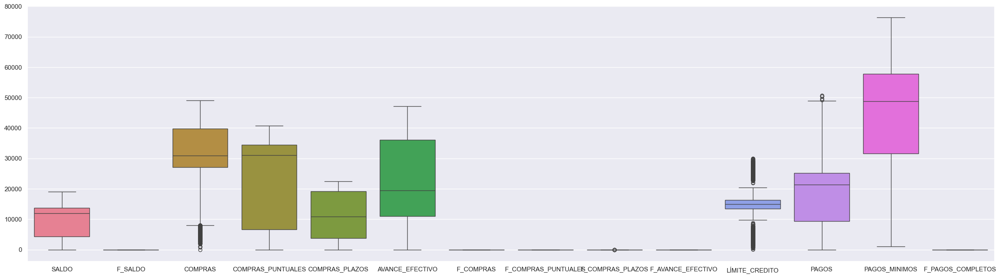

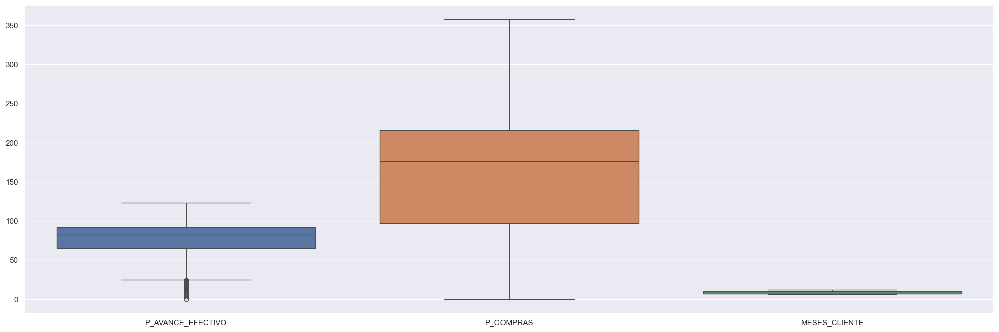

In [559]:
 #Separación de la variable duración (int) de variables float para ver mejor su contenido dada la diferencia de magnitudes en el dominio
name_cols_float = df_tc.select_dtypes(include = ['float']).columns
name_cols_int = df_tc.select_dtypes(include = ['int64']).columns
 #Visualización de todas las variables numéricas
fig=plt.figure(figsize=(30,8))
ax = sns.boxplot(data=df_tc[name_cols_float], orient="v")

fig=plt.figure(figsize=(25,8))
ax = sns.boxplot(data=df_tc[name_cols_int], orient="v")

## 1.4 Análisis de calidad de datos

Revisamos las dimensiones de calidad: unicidad, completitud, consistencia, validez.
En particular miramos si se presenta algún problema de calidad relacionado con la dimensión y pensamos en opciones para su posterior corrección en la etapa de preparación. 

### 1.4.1 Completitud - Análisis de valores nulos o vacíos

In [560]:
((df_tc.isnull().sum()/df_tc.shape[0])).sort_values(ascending=False) 

PAGOS_MINIMOS          0.034972
LÍMITE_CREDITO         0.000112
SALDO                  0.000000
F_AVANCE_EFECTIVO      0.000000
F_PAGOS_COMPLETOS      0.000000
PAGOS                  0.000000
P_COMPRAS              0.000000
P_AVANCE_EFECTIVO      0.000000
F_COMPRAS_PLAZOS       0.000000
F_SALDO                0.000000
F_COMPRAS_PUNTUALES    0.000000
F_COMPRAS              0.000000
AVANCE_EFECTIVO        0.000000
COMPRAS_PLAZOS         0.000000
COMPRAS_PUNTUALES      0.000000
COMPRAS                0.000000
MESES_CLIENTE          0.000000
dtype: float64


- **PAGOS_MINIMOS:**  
  - **4.39%** de los registros son nulos.  
  - Aunque el porcentaje de valores faltantes es relativamente bajo, es importante verificar si estos pocos casos pueden afectar de manera significativa.

- **LÍMITE_CREDITO:**  
  - **0.0112%** de los registros son nulos.
  - Estos porcentajes indican una pérdida mínima de datos.


Las variables  **PAGOS_MINIMOS** y **LÍMITE_CREDITO** son las únicas con datos nulos. Para completar los valores numéricos que se tienen como nulos, se llenaron con el promedio de los datos que se tiene actualmente.



### 1.4.2 Unicidad

El resultado indica que existen 0 filas duplicadas en el DataFrame. Esto significa que 0 registros son idénticos a otros, lo que podría representar datos redundantes en la información.

In [561]:
num_duplicados = df_tc.duplicated(keep = False).sum() 
num_duplicados

0

### 1.4.3 Consistencia

In [562]:
df_tc.F_SALDO.value_counts()

F_SALDO
0.250693    1
0.725721    1
0.846130    1
0.138971    1
0.815383    1
           ..
0.587658    1
0.765095    1
0.138071    1
0.767110    1
0.166820    1
Name: count, Length: 8950, dtype: int64

In [563]:
df_tc.F_COMPRAS.value_counts()

F_COMPRAS
0.496536    1
0.883632    1
0.777273    1
0.388050    1
0.812678    1
           ..
0.159767    1
0.745324    1
0.403252    1
0.733335    1
0.448753    1
Name: count, Length: 8950, dtype: int64

In [564]:
df_tc.F_COMPRAS_PUNTUALES.value_counts()

F_COMPRAS_PUNTUALES
0.464442    1
0.308493    1
0.237406    1
0.566881    1
0.194714    1
           ..
0.826938    1
0.287657    1
0.684283    1
0.262650    1
0.554458    1
Name: count, Length: 8950, dtype: int64

In [565]:
df_tc.F_COMPRAS_PLAZOS.value_counts()

F_COMPRAS_PLAZOS
0.821611    1
0.580985    1
0.514426    1
0.848701    1
0.593445    1
           ..
0.154382    1
0.575179    1
0.876743    1
0.559610    1
0.863972    1
Name: count, Length: 8950, dtype: int64

In [566]:
df_tc.F_AVANCE_EFECTIVO.value_counts()

F_AVANCE_EFECTIVO
0.194502    1
0.951121    1
0.961278    1
0.178320    1
1.004010    1
           ..
1.287868    1
0.915346    1
0.177881    1
0.993629    1
0.202943    1
Name: count, Length: 8950, dtype: int64

In [567]:
df_tc.P_AVANCE_EFECTIVO.value_counts()

P_AVANCE_EFECTIVO
85     260
84     250
87     243
90     234
88     234
      ... 
118      1
6        1
7        1
121      1
0        1
Name: count, Length: 118, dtype: int64

In [568]:
df_tc.F_PAGOS_COMPLETOS.value_counts()

F_PAGOS_COMPLETOS
0.817907    1
0.414473    1
0.386042    1
0.823809    1
0.406788    1
           ..
0.670779    1
0.295027    1
0.892505    1
0.381468    1
0.819986    1
Name: count, Length: 8950, dtype: int64

In [569]:
df_tc.MESES_CLIENTE.value_counts()

MESES_CLIENTE
10    3336
6     2091
7     1414
8     1021
11     575
9      512
12       1
Name: count, dtype: int64

1. se puede decir que la variable `F_AVANCE_EFECTIVO` tiene valores que no estan en el rango de 0 a 1.
2. los meses son enteros y estan de 6 a 12.
3. los porcentajes se encuentran entre 0 y 1.

### Análisis de Validez

Revisamos los valores distintos de las diferentes variables, aún no revisadas, para validar su valor.

In [570]:
df_tc['SALDO'].unique()

array([ 5323.148883, 12726.63812 ,  4305.572068, ..., 16464.31141 ,
       15531.88378 ,  5852.488566])

In [571]:
df_tc['COMPRAS'].unique()

array([26344.0722  , 37958.51902 , 28392.95334 , ...,  4296.196384,
       12219.32565 , 32480.9362  ])

In [572]:
df_tc['COMPRAS_PUNTUALES'].unique()

array([38237.44252,  5690.74244, 36009.47009, ..., 32554.75964,
       31795.9717 , 32368.35773])

In [573]:
df_tc['COMPRAS_PLAZOS'].unique()

array([ 3727.113162, 18733.81096 ,  2873.383232, ..., 11231.50043 ,
       12390.43213 ,  2825.555518])

In [574]:
df_tc['AVANCE_EFECTIVO'].unique()

array([15708.23968 , 38284.35443 , 14294.18503 , ..., 15214.67156 ,
       13856.39321 ,  8540.930924])

In [575]:
df_tc['P_COMPRAS'].unique()

array([ 77, 156,  81,  83, 182, 216,  99, 197, 217,  88, 291, 187, 184,
       199, 198, 159, 299, 263, 330, 206, 210, 109,  84, 188, 105, 252,
       175, 186, 226, 307, 224, 276,  89,  58, 200,  68, 219, 134, 140,
        74,  79,  65, 183, 174, 108, 235,  92,  93, 119, 244, 170, 293,
       202, 164,  70, 161, 298,  71, 295, 179, 292, 282, 213, 180, 204,
       253, 147, 239, 167,  28, 221, 328, 111,  32, 281, 165, 240, 155,
       270, 257, 176, 148, 169,  75, 100,  66,  39, 195, 243, 135, 203,
       229, 220,  82, 162, 222, 132, 177, 190, 104, 126, 201, 256,  51,
        69,  90, 290, 106, 114, 271,  49, 208, 258, 193, 207, 273, 285,
        60, 113, 278, 112, 172,  76, 242,  80, 181, 310, 151, 260, 101,
       116, 300,  73, 214, 236, 215, 152, 228,  17, 144, 231, 192, 218,
        48, 237,  91, 103, 166, 150, 205, 227, 230,  97,  40, 173, 185,
        86, 225,  87, 123,  54, 294, 124, 143, 146,  64, 272, 138, 196,
       194,  57,  59,  78, 115,  56, 275, 160, 129,  63, 107,  8

In [576]:
df_tc['LÍMITE_CREDITO'].unique()

array([16819.48004 , 15617.57058 , 15515.58621 , ...,  3307.587117,
        6148.23291 , 17179.14746 ])

In [577]:
df_tc['PAGOS'].unique()

array([21337.02746 ,  8000.183624, 27111.36049 , ..., 22947.75922 ,
       21369.50352 , 24703.92521 ])

In [578]:
df_tc['PAGOS_MINIMOS'].unique()

array([39452.95812, 63013.74848,         nan, ..., 54761.96221,
       50368.30906, 33166.54256])

Se puede decir que los datos cumplen con las especificaciones del problema.

## 1.5 Procesamiento de datos

### 1.5.1 Procesamiento de datos categóricos y numéricos

Las columnas numéricas con un % de vacíos bajo se promedia con los datos que hay y se agregan los valores faltantes.

In [579]:
# Completar los valores faltantes en las columnas numéricas con el promedio de cada columna
# Seleccionamos las columnas numéricas
numeric_cols = df_tc.select_dtypes(include=['int64', 'float64']).columns
df_tc[numeric_cols] = df_tc[numeric_cols].fillna(df_tc[numeric_cols].mean())


# Verificación de que no hallan valores nulos
print(df_tc.isnull().sum())

SALDO                  0
F_SALDO                0
COMPRAS                0
COMPRAS_PUNTUALES      0
COMPRAS_PLAZOS         0
AVANCE_EFECTIVO        0
F_COMPRAS              0
F_COMPRAS_PUNTUALES    0
F_COMPRAS_PLAZOS       0
F_AVANCE_EFECTIVO      0
P_AVANCE_EFECTIVO      0
P_COMPRAS              0
LÍMITE_CREDITO         0
PAGOS                  0
PAGOS_MINIMOS          0
F_PAGOS_COMPLETOS      0
MESES_CLIENTE          0
dtype: int64


Cambiar las filas de `F_AVANCE_EFECTIVO` que son mayores a 1.

In [580]:
# Ajustar los valores de F_AVANCE_EFECTIVO: cambiar aquellos que sean mayores a 1 a 1.
df_tc.loc[df_tc['F_AVANCE_EFECTIVO'] > 1, 'F_AVANCE_EFECTIVO'] = 1

# Verificar el cambio: Mostrar un resumen de la columna F_AVANCE_EFECTIVO
print("F_AVANCE_EFECTIVO después de la corrección:")
print(df_tc['F_AVANCE_EFECTIVO'].describe())


F_AVANCE_EFECTIVO después de la corrección:
count    8950.000000
mean        0.690597
std         0.376000
min         0.000000
25%         0.230716
50%         0.947651
75%         1.000000
max         1.000000
Name: F_AVANCE_EFECTIVO, dtype: float64


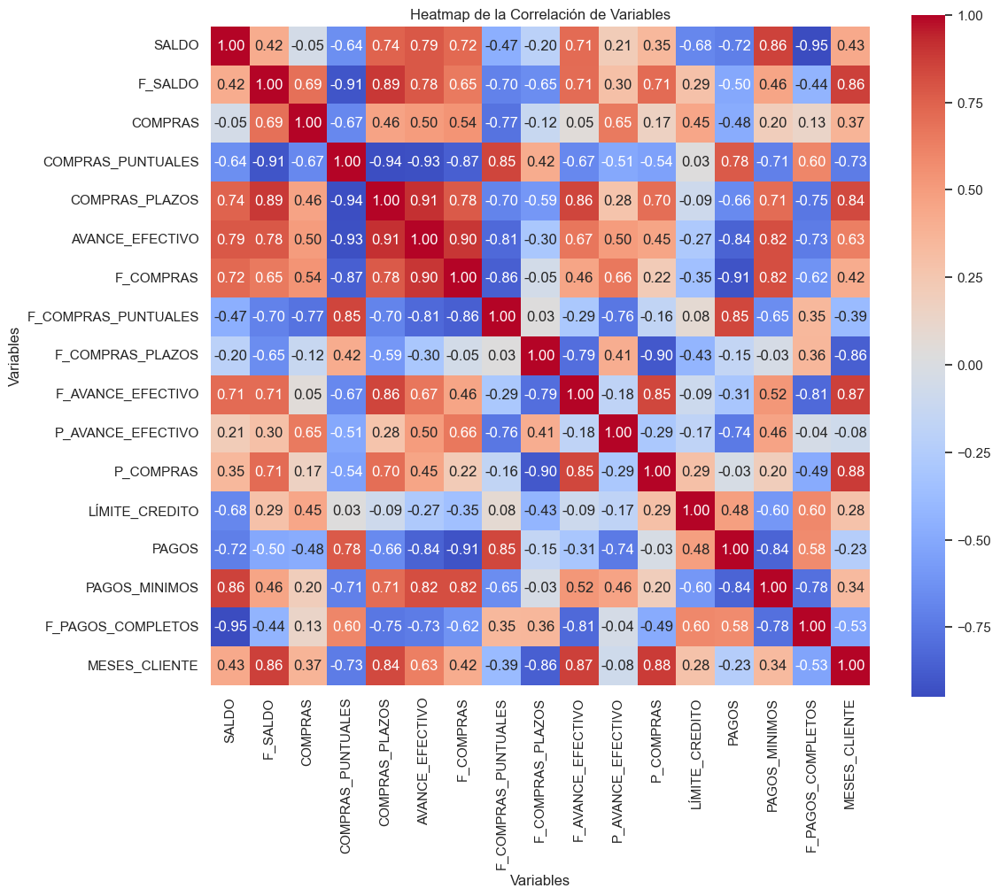

In [581]:
# Calcular la matriz de correlación de las variables numéricas del DataFrame
corr_matrix = df_tc.corr()

# Configurar la figura para el heatmap
plt.figure(figsize=(12, 10))

# Crear el heatmap de la matriz de correlación
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)

# Agregar título y etiquetas
plt.title("Heatmap de la Correlación de Variables")
plt.xlabel("Variables")
plt.ylabel("Variables")

# Mostrar el gráfico
plt.show()

Se observó que habían variables muy relacionadas que básicamente brindaban la misma información cómo:

- `SALDO` y `F_PAGOS_COMPLETOS` con una correlación de -0.95

# 2. Modelamiento

## 2.1 Implementación de Gaussian Mixture Model

**Descripción del Algoritmo**  
Gaussian Mixture Model (GMM) es un modelo probabilístico que asume que los datos se generan a partir de una mezcla de distribuciones gaussianas. En lugar de asignar un punto de datos a un único cluster, GMM calcula la probabilidad de que cada observación pertenezca a cada cluster, permitiendo modelar clusters de forma elíptica y manejar solapamientos entre grupos.


**Decisiones Importantes y Hiperparámetros**  
- **Número de clusters (`n_clusters`):** 4 luego de aplicar un algoritmo de optimización con BIC y AIC. 
- **Tipo de Covarianza (`covariance_type`):** Configurado típicamente como `'full'`, lo que permite que cada cluster tenga su propia matriz de covarianza. Esto otorga al modelo la flexibilidad para capturar clusters de formas variadas.
- **Random State:** Se establece un `random_state` de 42 para garantizar la reproducibilidad de los resultados.
- **Preprocesamiento:**  Se escalan las variables numéricas con `StandardScaler` y se calcula el PCA para disminuir el número de dimensiones.  

In [582]:
# 1. Seleccionar solo las columnas numéricas
numeric_cols = df_tc.select_dtypes(include=['float64', 'int64']).columns
df_numeric = df_tc[numeric_cols].copy()

# 2. Escalar los datos
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_numeric)

# 3. Aplicar PCA
pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_scaled)

# 4. Crear un DataFrame con los componentes principales
df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])

# 5. Mostrar la varianza explicada por cada componente
print("Varianza explicada por cada componente principal:")
print(pca.explained_variance_ratio_)

Varianza explicada por cada componente principal:
[0.5650619  0.22431964 0.16076352]


### Usamos AIC y BIC para encontrar el número de clusters óptimos:

- **AIC (Criterio de Información de Akaike):**
  - **Propósito:** Seleccionar el modelo que minimice la información perdida, es decir, aquel que explique mejor los datos sin sobreajustar.
  - **Interpretación:** Un menor valor de AIC indica un mejor balance entre ajuste y complejidad.

- **BIC (Criterio de Información Bayesiano):**
  - **Propósito:** Similar al AIC, pero con una penalización más fuerte para modelos complejos, especialmente cuando el tamaño de la muestra es grande.
  - **Interpretación:** Un menor valor de BIC sugiere un modelo preferido.




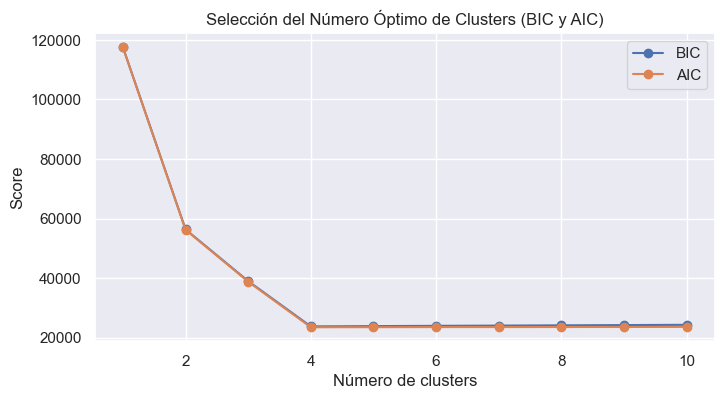

Óptimo según BIC: 4
Óptimo según AIC: 4


In [583]:
def find_optimal_clusters(X, cluster_range=range(1, 11), random_state=42, plot=True):
    """
    Encuentra el número óptimo de clusters usando Gaussian Mixture Models evaluando 
    los criterios BIC y AIC sobre un rango de números de clusters.

    Parámetros:
    - X: Array de datos (por ejemplo, los datos reducidos con PCA).
    - cluster_range: Rango de números de clusters a evaluar (default: 1 a 10).
    - random_state: Semilla para reproducibilidad.
    - plot: Si es True, genera una gráfica de BIC y AIC para visualizar el número óptimo.

    Retorna:
    - optimal_clusters_bic: Número óptimo de clusters según BIC.
    - optimal_clusters_aic: Número óptimo de clusters según AIC.
    - bic_scores: Lista de scores BIC para cada número de clusters evaluado.
    - aic_scores: Lista de scores AIC para cada número de clusters evaluado.
    """
    bic_scores = []
    aic_scores = []
    
    for n in cluster_range:
        gmm = GaussianMixture(n_components=n, random_state=random_state)
        gmm.fit(X)
        bic_scores.append(gmm.bic(X))
        aic_scores.append(gmm.aic(X))
    
    optimal_clusters_bic = cluster_range[np.argmin(bic_scores)]
    optimal_clusters_aic = cluster_range[np.argmin(aic_scores)]
    
    if plot:
        plt.figure(figsize=(8, 4))
        plt.plot(list(cluster_range), bic_scores, label='BIC', marker='o')
        plt.plot(list(cluster_range), aic_scores, label='AIC', marker='o')
        plt.xlabel("Número de clusters")
        plt.ylabel("Score")
        plt.title("Selección del Número Óptimo de Clusters (BIC y AIC)")
        plt.legend()
        plt.show()
    
    return optimal_clusters_bic, optimal_clusters_aic, bic_scores, aic_scores


optimal_bic, optimal_aic, bic_vals, aic_vals = find_optimal_clusters(X_pca)
print("Óptimo según BIC:", optimal_bic)
print("Óptimo según AIC:", optimal_aic)


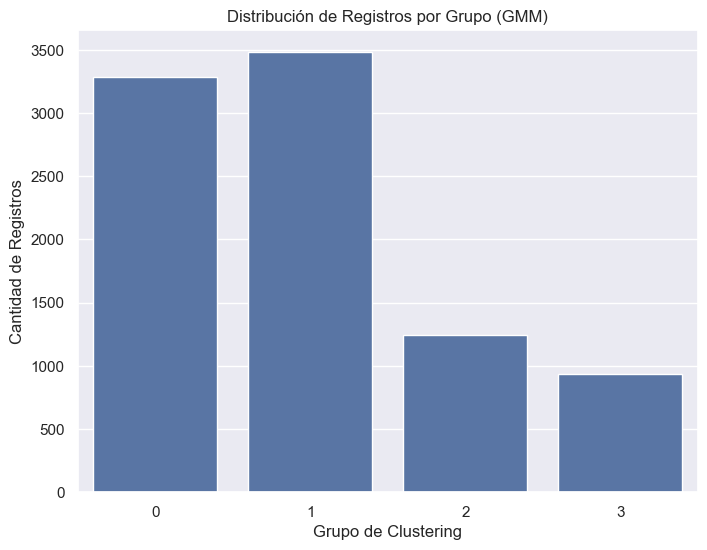

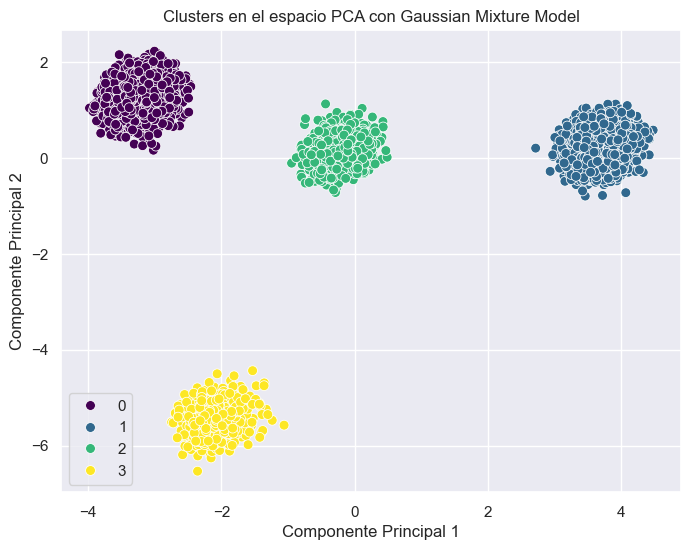

In [584]:
# 6. Aplicar Gaussian Mixture Model para clustering 
gmm = GaussianMixture(n_components=4, random_state=42)
clusters = gmm.fit_predict(X_pca)
df_tc['cluster_gaussian_mixture_model'] = clusters

# 7. Crear un histograma (gráfico de barras) para visualizar la distribución de registros por grupo (cluster)
plt.figure(figsize=(8,6))
sns.countplot(x='cluster_gaussian_mixture_model', data=df_tc,
              order=sorted(df_tc['cluster_gaussian_mixture_model'].unique()))
plt.xlabel("Grupo de Clustering")
plt.ylabel("Cantidad de Registros")
plt.title("Distribución de Registros por Grupo (GMM)")
plt.show()

# 8. Visualizar los clusters en el espacio PCA usando las dos primeras componentes
plt.figure(figsize=(8,6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=clusters, palette="viridis", s=50)
plt.title("Clusters en el espacio PCA con Gaussian Mixture Model")
plt.xlabel("Componente Principal 1")
plt.ylabel("Componente Principal 2")
plt.show()

### Conclusiones de los gráficos

1. **Histograma:**  
   - Los **clusters 0 y 1** contienen la mayor cantidad de registros.  
   - Los **clusters 2 y 3** presentan un menor número de registros .  
   - En términos de volumen de datos, se identifican dos grupos predominantes y dos grupos más específicos o minoritarios.

2. **Gráfico de Dispersión:**  
   - Los cuatro clusters aparecen **bien diferenciados** en el espacio de las dos primeras componentes principales, mostrando escaso solapamiento visual.  
   - Esta separación clara indica que el modelo GMM logró identificar patrones distintos entre los registros, evidenciando diferencias relevantes.


In [585]:
# Revisar el número exacto de elementos por clúster y las variables utilizadas.
df_tc.groupby('cluster_gaussian_mixture_model').count()

,SALDO,F_SALDO,COMPRAS,COMPRAS_PUNTUALES,COMPRAS_PLAZOS,AVANCE_EFECTIVO,F_COMPRAS,F_COMPRAS_PUNTUALES,F_COMPRAS_PLAZOS,F_AVANCE_EFECTIVO,P_AVANCE_EFECTIVO,P_COMPRAS,LÍMITE_CREDITO,PAGOS,PAGOS_MINIMOS,F_PAGOS_COMPLETOS,MESES_CLIENTE
cluster_gaussian_mixture_model,,,,,,,,,,,,,,,,,
0,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284,3284
1,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481,3481
2,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247,1247
3,938,938,938,938,938,938,938,938,938,938,938,938,938,938,938,938,938


- Todas las columnas muestran el mismo número de registros para un cluster, significa que los datos están completos.

In [586]:
#Transformar el contenido de las columnas a arreglo para facilitar aplicar funciones como las de visualización
cols_number = df_tc.to_numpy()
cols_number

array([[5.32314888e+03, 2.50692707e-01, 2.63440722e+04, ...,
        8.17906647e-01, 7.00000000e+00, 0.00000000e+00],
       [1.27266381e+04, 7.91306845e-01, 3.79585190e+04, ...,
        3.43119052e-01, 9.00000000e+00, 1.00000000e+00],
       [4.30557207e+03, 1.76531157e-01, 2.83929533e+04, ...,
        8.29074297e-01, 6.00000000e+00, 0.00000000e+00],
       ...,
       [1.64643114e+04, 1.89136159e-01, 4.29619638e+03, ...,
        1.29241926e-01, 8.00000000e+00, 2.00000000e+00],
       [1.55318838e+04, 1.17117953e-01, 1.22193257e+04, ...,
        8.74481770e-02, 8.00000000e+00, 2.00000000e+00],
       [5.85248857e+03, 1.66819599e-01, 3.24809362e+04, ...,
        8.19985793e-01, 7.00000000e+00, 0.00000000e+00]])

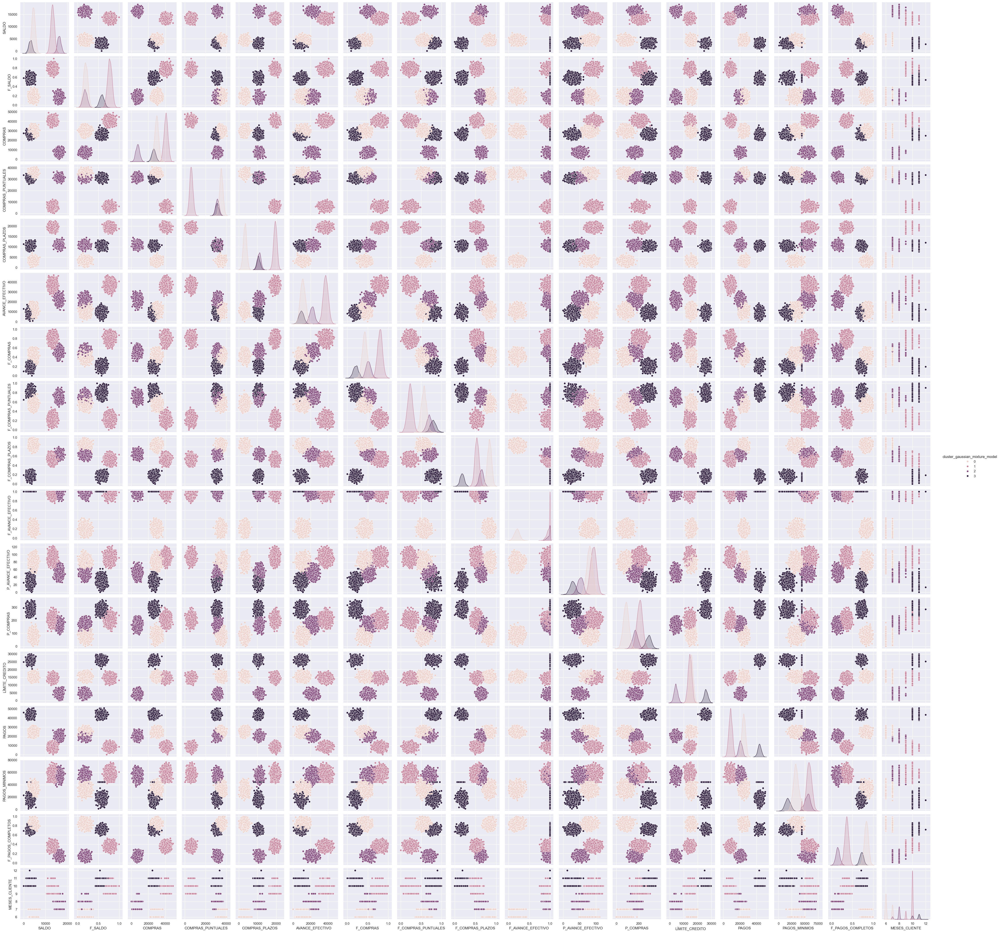

In [587]:
sns.pairplot(data=df_tc, hue="cluster_gaussian_mixture_model")        

### Conclusión del Pairplot

1. **Distribución Univariante (diagonales):**  
   - En la diagonal se aprecian histogramas para cada variable.  
   - Algunos muestran clara **diferenciación** entre las categorías, lo que indica que esas variables ayudan a distinguir grupos.  
   - En otras, las curvas se solapan, evidenciando variables que no separan bien las categorías.

2. **Relación Bivariante (off-diagonal):**  
   - Cada subgráfico compara dos variables.  
   - En varios casos se aprecia una **separación notable** de los puntos por color, lo que sugiere que esas combinaciones de variables discriminan bien las categorías.  
   - En otras combinaciones, los datos se mezclan, revelando menos poder de diferenciación.

3. **Conclusión General:**  
   - El pairplot revela **patrones claros** en ciertas variables (o pares de variables), donde las categorías muestran poca superposición.  
   - Existen también variables (o pares) con un mayor solapamiento, indicando que no todas las dimensiones contribuyen de forma uniforme a la separación de los grupos.  
   - En conjunto, el pairplot sugiere que el dataset cuenta con **variables relevantes** para distinguir categorías, aunque algunos rasgos no sean tan efectivos en la discriminación. 


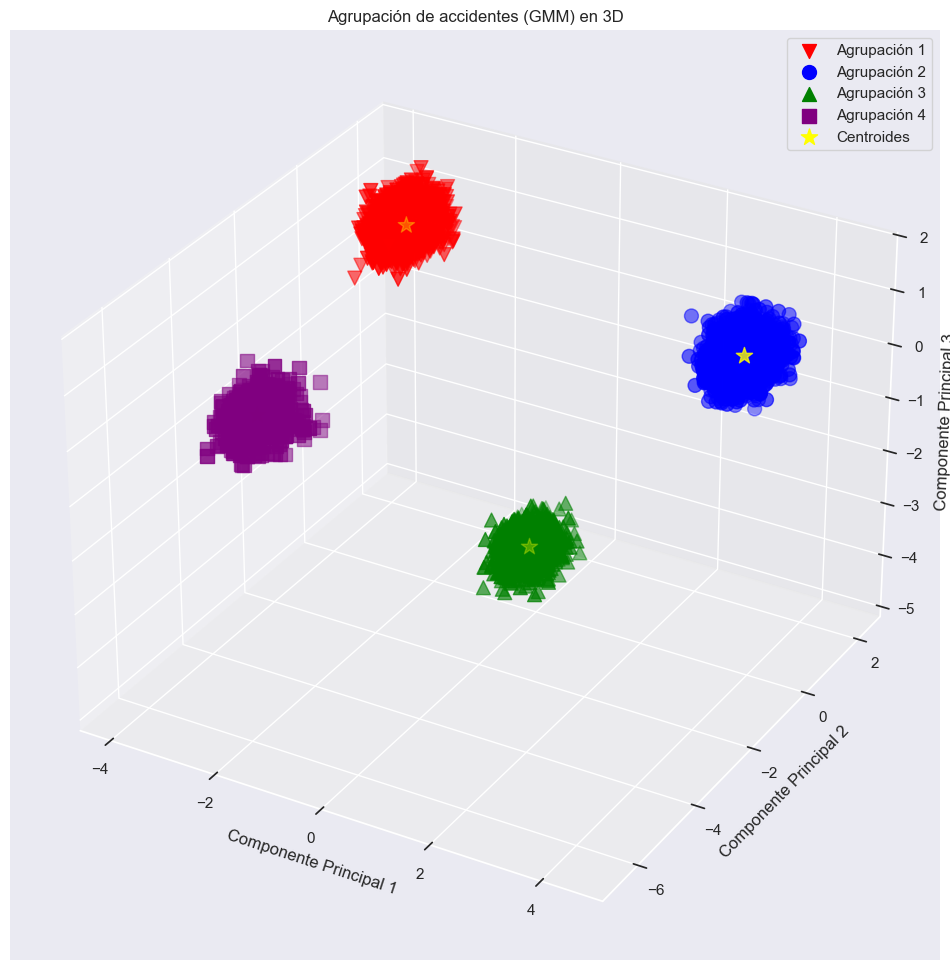

In [595]:
# Obtener las etiquetas de los clusters utilizando el modelo GMM
labels = gmm.predict(X_pca)

# Crear la figura 3D
fig = plt.figure(figsize=(12, 80))
ax = fig.add_subplot(111, projection='3d')

# Graficar cada agrupación (cluster) en el espacio 3D usando los tres componentes principales
ax.scatter(X_pca[labels == 0, 0], X_pca[labels == 0, 1], X_pca[labels == 0, 2],
           s=100, marker='v', c='red', label='Agrupación 1')
ax.scatter(X_pca[labels == 1, 0], X_pca[labels == 1, 1], X_pca[labels == 1, 2],
           s=100, marker='o', c='blue', label='Agrupación 2')
ax.scatter(X_pca[labels == 2, 0], X_pca[labels == 2, 1], X_pca[labels == 2, 2],
           s=100, marker='^', c='green', label='Agrupación 3')
ax.scatter(X_pca[labels == 3, 0], X_pca[labels == 3, 1], X_pca[labels == 3, 2],
           s=100, marker='s', c='purple', label='Agrupación 4')

# Graficar los "centroides" del GMM (las medias de cada componente) en 3D
ax.scatter(gmm.means_[:, 0], gmm.means_[:, 1], gmm.means_[:, 2],
           s=150, marker='*', c='yellow', label='Centroides')

# Configurar el gráfico 3D
ax.set_title('Agrupación de accidentes (GMM) en 3D')
ax.set_xlabel("Componente Principal 1")
ax.set_ylabel("Componente Principal 2")
ax.set_zlabel("Componente Principal 3")
ax.legend()

plt.show()

